<a href="https://colab.research.google.com/github/jiananwu72/LuFeO3Detect/blob/main/LuFeO3/LFO_Analysis_Colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This Notebook is specifically for running in Google Colab.

## Environment Installation & Data Loading

In [1]:
# Downloading packages
!pip install -q pyNSID sidpy atomap nanonispy gwyfile pyTEMlib wget ipympl importlib
!pip install numpy==1.26.4

In [2]:
# Connecting to widget (only supported by numpy 1) to produce interacting plots
%matplotlib widget
import numpy as np
import matplotlib.pylab as plt
import sys

# Connecting to Google Drive
if 'google.colab' in sys.modules:
    from google.colab import output
    output.enable_custom_widget_manager()
    from google.colab import drive
    drive.mount('/content/drive')

%load_ext autoreload
%autoreload 2

Mounted at /content/drive


## Automated Detection of Layers from Pictures

This cell loads one image at a time.

Non-Stacked


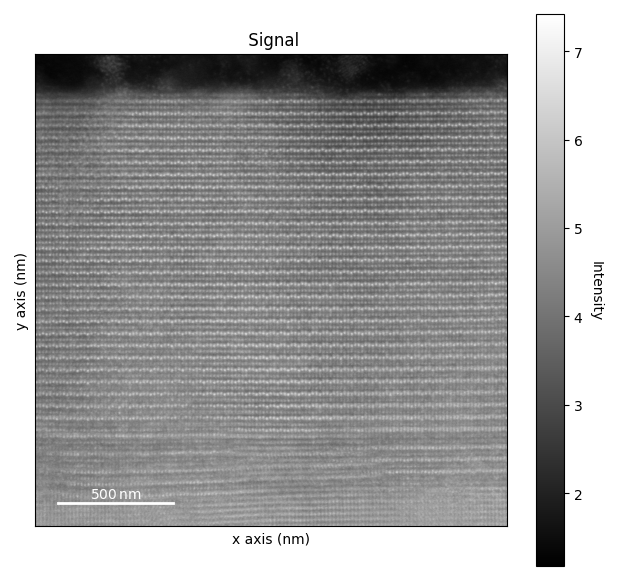

In [3]:
import skimage
import hyperspy.api as hs

stack_num = 0 # The index of stacked image

# Change the name of s_load to load different plots.
# Note that some datasets are in stacks and their data will be 3-dimension,
# where the first dimention is the index of a single stacked image. We want to
# look at one image each of the time, so for those stacked images, please change
# stack_num to view different images.

# Load one file at a time.
# These commented files are some that I want think could be reevaluated later for references.
s_load = hs.load('/content/drive/MyDrive/Data/Jaume LFO/HAADF_01.dm3')
# s_load = hs.load('/content/drive/MyDrive/Data/Jaume LFO/FEI HAADF Stack 06.dm3')
# s_load = hs.load('/content/drive/MyDrive/Data/Jaume LFO/ITO LuFeO3_0030.dm3')
# s_load = hs.load('/content/drive/MyDrive/Data/Guodong YFO/YFO/HAADF2.dm3')
# s_load = hs.load('/content/drive/MyDrive/Data/Guodong YFO/YFO_083023/Perfect.dm3')
# s_load = hs.load('/content/drive/MyDrive/Data/Guodong YFO/YFO_083023/Edge_dislocation.dm3')
# s_load = hs.load('/content/drive/MyDrive/Data/Arashdeep YFO/Analysis-selected 111419/Integrate of Alignment of Stack-8.dm3')

if len(s_load.data.shape) == 2: # Non-stacked
    print("Non-Stacked")
    s = s_load
else: # Stacked, where s_load.data.shape = 3
    print("Stacked")
    s = s_load.inav[stack_num]

# Plot the image in pixels. We can plot in nanometers by simply doing s.plot().
import copy
s_copy = copy.deepcopy(s)
for ax in s_copy.axes_manager.signal_axes:
    ax.scale = 1.0
    ax.offset = 0.0

plt.close()
s_copy.plot()

Here we crop horizontal strips that contains only one layer of Lu atoms. I want to automate the process of finding Lu atoms, but there are some hyperparameters here that needs to be tuned for each of the images (labeled TUNE THIS) so please check them out.

We will tune parameters here about window width and left & right boundaries for window detections. This could be taken care of to produce more promising results. A reason is that, e.g. the left part of an image and the right part could be different (e.g. tilting, noise, etc.) so they appear to have different strengths. A easy way to do that is by simply test them seperately.

In the ideal case, the windows locating at local strengths maximums are where Lu layers are, and the strengths looks like perfect waves. This cell identifies those local peaks of those strips, which should be the strips that successfully covers all the local Lu Peaks. We should exclude those layers that doesn't look like normal layers (e.g. empty part of an image) and kkep an eye a on some layers that doesn't looks right (e.g. consecutive Fe layers, or consecutive Lu layers).

Things could go wrong if the windows are a little too wide and includes some atoms from the surrounding Fe layers. There will appear two consecutive peaks at those positions. In that situation, a more complicated method is needed to find out the crests in the double peaks. In comparison, it is easier to just tune windows better if thats an option.


Indices of local peaks: [ 304  357  409  462  515  568  621  673  726  780  833  885  938  991
 1044 1097 1150 1202 1255 1308 1360]


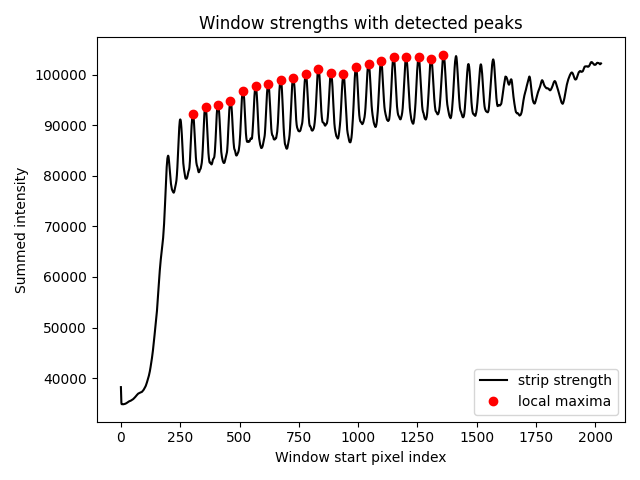

In [4]:
import scipy.signal
# Adjust these parameters to tune the window size and the range of pixels
# to search for peaks.

window_height_nm = 0.28 # TUNE THIS. For LFO, you can start from 0.28
left_bound = 600 # TUNE THIS
right_bound = 1500 # TUNE THIS
start_pixel = 280 # TUNE THIS
end_pixel = 1400 # TUNE THIS

if right_bound > s.data.shape[0]:
    right_bound = s.data.shape[0]
    print("right_bound exceeds image width; using image width instead.")

scale = s.axes_manager['x'].scale
window_height = int(window_height_nm/scale)
strengths = []
H, W = s.data.shape
for i in range(H-window_height):
    s_cropped = s.isig[left_bound:right_bound, i:i+window_height]
    strengths.append(np.array(s_cropped).sum())


# This part finds the local peaks of the generated intensity plot.

# Find local peaks in the specified range; might need to change height based on
# our results. min_sep are to make sure two peaks are not too close, which could
# happen when two bumps are on one peak (e.g. at pixels 254, 256, where 255 is
# slightly lower than both) and prom is to avoid detecting bumps in
# local minima.
min_sep = 3
prom = prom = 0.1 * (np.max(strengths) - np.min(strengths))
peaks, _ = scipy.signal.find_peaks(
    strengths[start_pixel:end_pixel],
    height=0,
    distance=min_sep,
    prominence=prom
)

# Adjust peak indices to the original array's indexing
peaks_global_indices = peaks + start_pixel

# Store the peak indices as integers in a NumPy array
peak_indices = np.array(peaks_global_indices, dtype=int)

print("Indices of local peaks:", peak_indices)

# Plotting
strengths = np.array(strengths)
plt.close()
plt.figure()
plt.plot(strengths, '-k', label='strip strength')
plt.plot(peak_indices, strengths[peak_indices], 'ro', label='local maxima')
plt.xlabel('Window start pixel index')
plt.ylabel('Summed intensity')
plt.title('Window strengths with detected peaks')
plt.legend()
plt.tight_layout()
plt.show()

To see whether the window heights, left and right boundaries we have chosen make sense, we test all of the windows by interating through the indices of windows and see the results in the cell below and adjust accordingly. If some windows are clearly not aligned (e.g. falling above or below the window), please feel free to crop them off from this test.

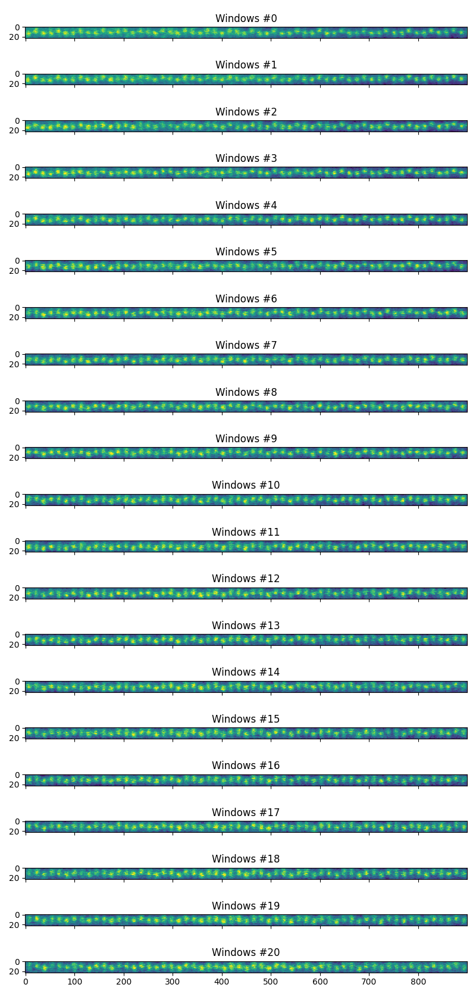

In [5]:
windows_num = peak_indices.shape[0]
fig, ax = plt.subplots(windows_num, 1, figsize=(8, windows_num*0.8), sharex=True, sharey=True)
for window_index in range(windows_num):
    s_cropped = s.isig[left_bound:right_bound, peak_indices[window_index]:peak_indices[window_index]+window_height]
    ax[window_index].imshow(s_cropped, interpolation='nearest', vmax=np.median(np.array(s_cropped))+3*np.std(np.array(s_cropped)))
    ax[window_index].set_title(f'Windows #{window_index}')
plt.tight_layout()

## Atom Positions Finding & Refining Functions

Here are four functions defined in the process of finding the atom positions. The first one here threshold a striped window to binary masks, which should work great most of the cases. The way this is done is by filtering out the median inside an image within a disk of 20 pixels so that environmental errors are excluded. Use get_plot in a testing cells to see how the filter works.

The second function cleans the mask by closing up small islands and peninsulas (like a small piece of 1's in 0's or vice versa) so that the masked atoms become blobs that are nearly round. Neighboring atoms could be somehow connected by small bridges; I keep them because otherwise it would be hard to keep some atoms that has weak signals. I solve the bridging problems in the next function. The parameters obj_param_nm and holes_param_nm are used to filter a reasonable range of those islands.

The thrid function detect the positions of atoms by peak the local maximum values produced by distance_transform_edt. The distance_transform_edt function transform our binary mask to a mask with distances to the closet background, so ideally the value would be the largest in the middle of the atom. This helps to detect the "blobs" like structures of atoms rather than looking at the maximum intensities and get rid of the possible bridges. However, we need to make larger detection areas when recording atom strength levels.

The last function refines the positions based on the center of gravity method; check out pyTEMlib source codes on how those stuffs are done. This really just aims to give a slightly better results.

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter, median_filter
from skimage.filters import median, threshold_yen
from skimage.morphology import disk

def Thresholding(image, disk_param_nm = 0.235, get_plot = False):
    strip = image.data
    col_med = np.median(strip, axis=0)
    disk_param = int(disk_param_nm / image.axes_manager['x'].scale)
    bg1_1d = median_filter(col_med, size=2*disk_param+1)
    bg1 = np.tile(bg1_1d[np.newaxis, :], (strip.shape[0], 1))
    flat = strip - bg1

    th = threshold_yen(flat)
    mask = flat > th

    if get_plot:
        fig, axes = plt.subplots(2,1, figsize=(8,5))
        axes[0].imshow(image, cmap='gray', origin='lower')
        axes[0].set_title("Original")
        axes[1].imshow(mask, cmap='gray', origin='lower')
        axes[1].set_title("Thresholded")
        plt.tight_layout()
        plt.show()

    return mask

from skimage.morphology import remove_small_objects, remove_small_holes, binary_closing, binary_opening, disk

def Cleaning(image, mask, get_plot = False, obj_param_nm = 0.2, holes_param_nm = 0.2):
    scale = image.axes_manager['x'].scale
    obj_param = int(obj_param_nm/scale)
    holes_param = int(holes_param_nm/scale)
    clean1 = binary_closing(mask)
    clean2 = remove_small_objects(clean1, min_size=obj_param)
    clean3 = remove_small_holes(clean2, area_threshold=holes_param)
    clean4 = binary_opening(clean3)
    clean = clean4

    if get_plot:
        fig, axes = plt.subplots(5,1, figsize=(8,5))
        axes[0].imshow(mask,   cmap='gray', origin='lower')
        axes[0].set_title("Before")
        axes[1].imshow(clean1, cmap='gray', origin='lower')
        axes[1].set_title("After 1")
        axes[2].imshow(clean2, cmap='gray', origin='lower')
        axes[2].set_title("After 2")
        axes[3].imshow(clean3, cmap='gray', origin='lower')
        axes[3].set_title("After 3")
        axes[4].imshow(clean4, cmap='gray', origin='lower')
        axes[4].set_title("After 4")
        for ax in axes:
            ax.axis('off')
        plt.tight_layout()
        plt.show()

    return clean

from scipy.ndimage import distance_transform_edt
from skimage.feature import peak_local_max

def GetPositions(image, mask, clean, get_plot = False, min_dist_nm = 0.095):
    masked_img = image.data.copy()
    masked_img[~mask] = 0

    # Here we look at atom shapes and find the center:

    dist = distance_transform_edt(clean)

    scale = image.axes_manager['x'].scale
    min_dist = int(min_dist_nm/scale)

    atom_positions = peak_local_max(
        dist,
        min_distance=min_dist,
        threshold_abs=0,
        labels=clean
    )

    # If we wan to solely look at atoms peaks, we can comment codes above and
    # uncomment these below:

    # scale = image.axes_manager['x'].scale
    # min_dist = int(min_dist_nm/scale)

    # atom_positions = peak_local_max(
    #     masked_img,
    #     min_distance=min_dist,
    #     threshold_abs=0,
    #     labels=clean
    # )

    y_centers, x_centers = atom_positions[:,0], atom_positions[:,1]

    if get_plot:
        fig1, ax = plt.subplots(2, 1,figsize=(8,4))
        ax[0].imshow(clean, cmap='gray', origin='lower')
        ax[0].set_title("Masked image")
        ax[1].imshow(masked_img, interpolation='nearest', vmax=np.median(np.array(image))+3*np.std(np.array(image)))
        ax[1].scatter(x_centers, y_centers, c='r', s=20, alpha = .5)
        ax[1].set_title("Masked → local max")
        for a in ax: a.axis('off')
        plt.tight_layout()
        plt.show()

    return masked_img, atom_positions

import pyTEMlib.atom_tools

def AtomRefine(image, masked_img, atom_positions, get_plot = False, atom_radius_nm = 0.174):

    scale = image.axes_manager['x'].scale
    atom_radius = int(atom_radius_nm/scale)
    sym = pyTEMlib.atom_tools.atom_refine(image.data, atom_positions, atom_radius, max_int = 0, min_int = 0, max_dist = 2)
    refined_atoms = np.array(sym['atoms'])

    if get_plot:
        fig, ax = plt.subplots(2, 1, figsize=(10, 4), sharex=True, sharey=True)
        ax[0].imshow(s_cropped, interpolation='nearest', vmax=np.median(np.array(s_cropped))+3*np.std(np.array(s_cropped)))
        ax[0].scatter(refined_atoms[:,1],refined_atoms[:,0],  s=10, alpha = 0.3, color = 'red')
        ax[0].set_title('refined atom postion')
        ax[1].imshow(s_cropped, interpolation='nearest', vmax=np.median(np.array(s_cropped))+3*np.std(np.array(s_cropped)))
        ax[1].scatter(atom_positions[:, 1], atom_positions[:, 0], c='r', s=10, alpha = .3);
        ax[1].set_title('blobs on image');

    return refined_atoms


You don't have igor2 installed.     If you wish to open igor files, you will need to install it     (pip install igor2) before attempting.
Symmetry functions of spglib enabled
Qt dialogs are not available
SimpleITK not installed; Registration Functions for Image Stacks not available
install with: conda install -c simpleitk simpleitk 


We could check using the codes below to see how does atom detections do in one sliced window. We can change the index to view how it works for all these windows. Use "get_plot = True" and any function to get a plot of processing at that stage.

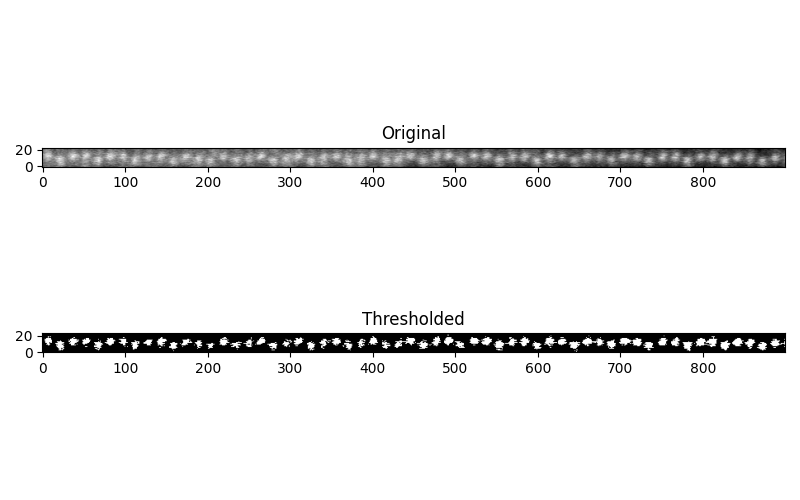

using radius  14 pixels


  0%|          | 0/59 [00:00<?, ?it/s]

In [7]:
window_ind = 0
image = s.isig[left_bound:right_bound, peak_indices[window_ind]:peak_indices[window_ind]+window_height]
# mask = Thresholding(image)
mask = Thresholding(image, disk_param_nm = 0.10, get_plot = True)
clean = Cleaning(image, mask)
masked_img, atom_positions = GetPositions(image, mask, clean)
refined_atoms = AtomRefine(image, masked_img, atom_positions)

We run through all the detected windows of Lu atoms iteratively. The results will be stored in a dictionary refind_atoms_dict.

In [8]:
%%capture
refined_atoms_dict = {}
for i, y_pixel in enumerate(peak_indices):
    # Crop the image for the current window
    s_cropped_it = s.isig[left_bound:right_bound, y_pixel:y_pixel+window_height]
    image_it = s_cropped_it

    # Apply the atom detection and refinement functions; we can change some
    # parameters if needed.
    mask_it = Thresholding(image_it, disk_param_nm = 0.10)
    clean_it = Cleaning(image_it, mask_it)
    masked_img_it, atom_positions_it = GetPositions(image_it, mask_it, clean_it)
    refined_atoms_it = AtomRefine(image_it, masked_img_it, atom_positions_it)

    # Store the refined atoms in the dictionary with the window index as the key
    refined_atoms_dict[i] = refined_atoms_it

## Data recording and anomalies handling

 We need to take care of are the distances between atoms. Are they too far or too close to the neighboring atoms? To handle these, we only need to look at the x-axis (because it is impossible that two atoms, with one of them are abnormal, are too far apart of too close together on the y-axis while being normal on the x-axis).

Running our detection iteratively, we can store all the outliers in the windows and we can see where outliers are.

In [9]:
sigma_allowance = 4 # TUNE THIS
def FindOutliers(atom_positions_it):
    x = np.sort(atom_positions_it[:,1])
    dx = x[1:] - x[:-1]

    med = np.median(dx)
    mad = np.median(np.abs(dx - med))
    sigma = 1.4826 * mad

    # -- If there's literally no spread, return no outliers --
    if sigma == 0:
        return np.array([],dtype=float), np.array([],dtype=float), med

    z = (dx - med) / sigma

    larger_idx = np.where(z >  sigma_allowance)[0]
    smaller_idx = np.where(z < -sigma_allowance)[0]

    larger_positions = x[larger_idx + 1]
    smaller_positions = x[smaller_idx + 1]

    return larger_positions, smaller_positions, med

larger_dict = {}
smaller_dict = {}
med_dict = {}
for i, _ in enumerate(refined_atoms_dict):
    larger_positions_it, smaller_positions_it, med_it = FindOutliers(refined_atoms_dict[i])
    med_dict[i] = med_it

    if larger_positions_it is not None:
        larger_dict[i] = larger_positions_it
    else:
        larger_dict[i] = []

    if smaller_positions_it is not None:
        smaller_dict[i] = smaller_positions_it
    else:
        smaller_dict[i] = []

larger_where = {
    k: v
    for k, v in larger_dict.items()
    if (hasattr(v, "__len__") and len(v) > 0)
}
smaller_where = {
    k: v
    for k, v in smaller_dict.items()
    if (hasattr(v, "__len__") and len(v) > 0)
}
print("Wide outliers found in the following windows and positions:")
for window_index, positions in larger_where.items():
    print(f"Window {window_index}: {positions}")
print("Narrow outliers found in the following windows and positions:")
for window_index, positions in smaller_where.items():
    print(f"Window {window_index}: {positions}")

Wide outliers found in the following windows and positions:
Window 11: [161]
Narrow outliers found in the following windows and positions:


In [10]:
import numpy as np

filled_refined = {}
new_pts_dict = {}

for w, pts in refined_atoms_dict.items():
    pts = np.asarray(pts)
    if pts.size == 0:
        filled_refined[w] = pts
        continue
    if larger_where.get(w, None) is None:
        filled_refined[w] = pts
        continue

    # sort by x
    pts_sorted = pts[np.argsort(pts[:,1])]
    xs = pts_sorted[:,1]
    ys = pts_sorted[:,0]

    med = med_dict[w]                  # your median spacing for window w
    big_gaps = larger_dict.get(w, [])  # x-positions where gaps were too large

    new_pts = []
    for x_gap in big_gaps:
        # find the index of the point *after* the gap
        j = np.where(xs == x_gap)[0]
        j = j[0]
        x_prev, x_next = xs[j-1], xs[j]
        y_prev, y_next = ys[j-1], ys[j]

        gap = x_next - x_prev
        n_missing = int(round(gap / med)) - 1
        if n_missing <= 0:
            continue

        # insert and linearly interpolate x and y
        for k in range(n_missing):
            x_gap = (x_prev + x_next)/n_missing
            x_new = x_prev + (k+1)*med
            # linear interp in y
            t = (x_new - x_prev) / (x_next - x_prev)
            y_new = y_prev + t*(y_next - y_prev)
            new_pts.append((y_new, x_new))

    if new_pts:
        # stack old + new, then resort by x
        new_pts_dict[w] = new_pts
        all_pts = np.vstack([pts_sorted, np.array(new_pts)])
        final_order = np.argsort(all_pts[:,1])
        filled_refined[w] = all_pts[final_order]
    else:
        filled_refined[w] = pts_sorted

# Replace your old dict (if you like)
atoms_dict = filled_refined

We can see where outliers are and what happened in case an outlier is there:

Text(0.5, 1.0, 'atom postion')

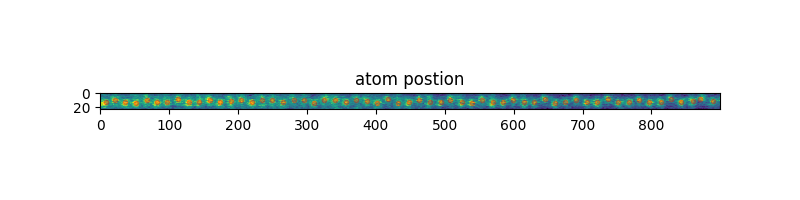

In [11]:
plot_ind = 2
s_cropped = s.isig[left_bound:right_bound, peak_indices[plot_ind]:peak_indices[plot_ind]+window_height]
refined_atoms_plot = refined_atoms_dict[plot_ind]

plt.figure(figsize=(8,2))
plt.imshow(s_cropped, interpolation='nearest', vmax=np.median(np.array(s_cropped))+3*np.std(np.array(s_cropped)))
plt.scatter(refined_atoms_plot[:,1], refined_atoms_plot[:,0], s=10, alpha = 0.3, color = 'red')
if new_pts_dict and bool(new_pts_dict.get(plot_ind)):
    new_pts_plot = np.array(new_pts_dict[plot_ind])
    plt.scatter(new_pts_plot[:,1], new_pts_plot[:,0], s=10, alpha = 0.3, color = 'blue')
plt.title('atom postion')

Keep in mind that the same set of input parameters can possibly only work for like a part of an image. So we do need to crop a smaller size to analyze.

## Atom Strength Labeling & Analysis

This part is done, comment is not written.

In [12]:
from skimage.draw import line
from skimage.morphology import disk
from scipy.signal import convolve2d

# Iterate through start_ind to (excluding) end_ind of windows to get strengths
start_ind = 0 # TUNE THIS
end_ind = 22 # TUNE THIS
if end_ind > len(peak_indices):
    end_ind = len(peak_indices)
    print("end_ind exceeds Lu windows number; using number of windows instead.")

detect_radius = 0.03
# Make sure this is not too large.
# It is possible that the radius can go outside of the image.
scale = image.axes_manager['x'].scale
radius = int(detect_radius/scale)

paths = {}   # will hold for each window its sorted atom-(y,x) path
results = {} # will hold distances & intensities per window

for window_ind in range(start_ind, end_ind):
    pts = atoms_dict.get(window_ind, None)
    if pts is None or len(pts)==0:
        continue

    order = np.argsort(pts[:,1])
    pts = pts[order]
    paths[window_ind] = pts

    # Fit into 1-D line using SVD
    centroid     = pts.mean(axis=0)            # (ȳ, x̄)
    pts_centered = pts - centroid              # shift origin to centroid
    _, _, Vt     = np.linalg.svd(pts_centered, full_matrices=False)
    dir_pc       = Vt[0]                       # unit direction of best‐fit line
    perp_unit    = np.array([-dir_pc[1], dir_pc[0]])
    perp_unit   /= np.linalg.norm(perp_unit)
    deviations   = pts_centered.dot(perp_unit)

    rr_segs, cc_segs = [], []
    atom_indices = []
    cum_len = 0
    for i, ((y0, x0), (y1, x1)) in enumerate(zip(pts[:-1], pts[1:])):
        rr, cc = line(int(round(y0)), int(round(x0)),
                      int(round(y1)), int(round(x1)))
        atom_indices.append(cum_len)
        rr_segs.append(rr)
        cc_segs.append(cc)
        cum_len += len(rr)
    atom_indices.append(cum_len-1)
    rr_path = np.concatenate(rr_segs)
    cc_path = np.concatenate(cc_segs)

    coords = np.vstack((rr_path, cc_path)).T
    deltas = np.diff(coords, axis=0)
    steps  = np.hypot(deltas[:,0], deltas[:,1])
    dist = np.concatenate(([0.], np.cumsum(steps)))

    image_data = s.isig[
        left_bound:right_bound,
        peak_indices[window_ind]:peak_indices[window_ind] + window_height
    ].data

    kernel   = disk(radius).astype(float)       # 1 inside disk, 0 outside
    conv_img  = convolve2d(image_data, kernel, mode='same')
    I_path = conv_img[rr_path, cc_path]

    y_at = np.round(pts[:,0]).astype(int)
    x_at = np.round(pts[:,1]).astype(int)
    I_atoms = conv_img[y_at, x_at]

    results[window_ind] = {
        'path_pixels':    coords,   # (N_pixels, 2) array of (y,x)
        'distance':       dist,     # length N_pixels
        'intensity':      I_path,   # length N_pixels
        'atom_indices':   atom_indices,
        'deviations':     deviations
    }


end_ind exceeds Lu windows number; using number of windows instead.


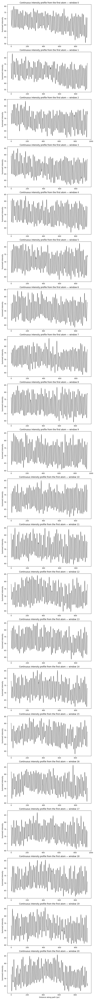

In [13]:
plt.close()
num_windows_to_plot = end_ind - start_ind
fig, axes = plt.subplots(num_windows_to_plot, 1, figsize=(8, 4 * num_windows_to_plot))
plot_atoms = False # Optional

for i, ind in enumerate(range(start_ind, end_ind)):
    if ind in results:
        res = results[ind]
        dist = res['distance']        # shape = (N_pixels,)
        I_path = res['intensity']     # shape = (N_pixels,)
        atom_ind = res['atom_indices']
        deviations = res['deviations']
        dist_atoms = np.array([dist[i] for i in atom_ind])
        I_atoms = np.array([I_path[i] for i in atom_ind])

        ax = axes[i]
        ax.plot(dist, I_path, '-k', lw = 1, zorder = 1)
        if plot_atoms:
            sc = ax.scatter(dist_atoms, I_atoms,
                       c=deviations,
                       cmap='coolwarm',
                       s=40,
                       label='atoms',
                       zorder=3)
            fig.colorbar(sc, ax=ax, label='perp. deviation (px)')
        ax.set_ylabel('Summed intensity')
        ax.set_title(f'Continuous intensity profile from the first atom — window {ind}')

axes[-1].set_xlabel('Distance along path (px)')
plt.tight_layout()
plt.show()

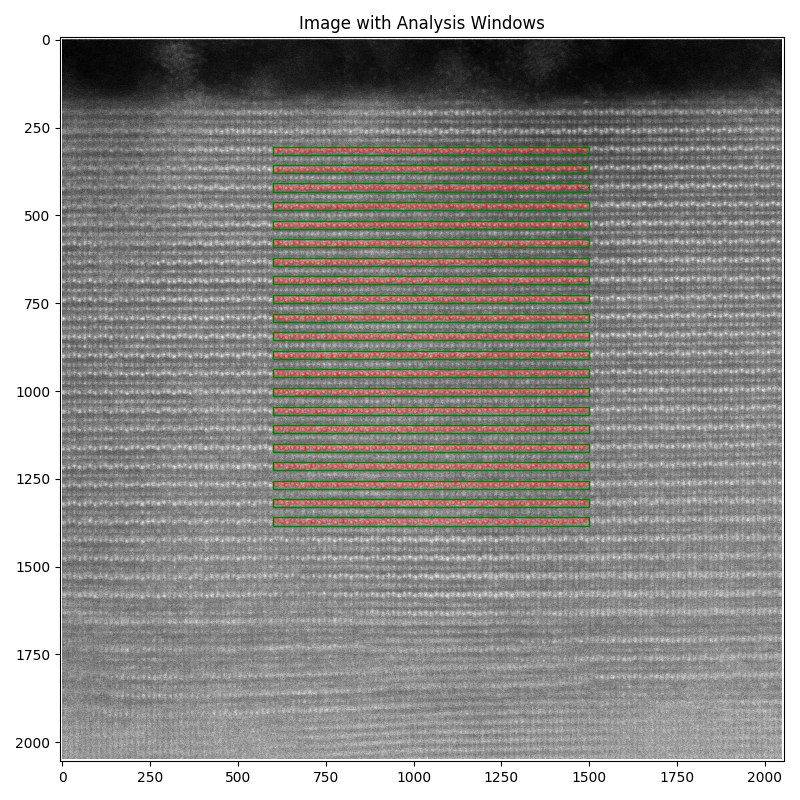

In [14]:
import matplotlib.patches as patches

plt.figure(figsize=(8, 8))
plt.imshow(s.data, cmap='gray', interpolation='nearest')

x0 = left_bound
width = right_bound - left_bound
image_height = s.data.shape[1]
height = window_height

plot_windows = True # Optional condition to plot windows

# Iterate through the peak indices to plot all the windows
if plot_windows:
  for ind in range(start_ind, end_ind):
      y0 = peak_indices[ind]
      rect = patches.Rectangle((x0, y0), width, height, linewidth=1,
                                edgecolor='green', facecolor='none') # Made labels lighter
      plt.gca().add_patch(rect)

# Plot original refined atoms in red
all_refined_atoms = []
for window_ind, atoms in refined_atoms_dict.items():
    # Offset atoms to their correct position in the full image
    offset_atoms = atoms.copy()
    offset_atoms[:, 0] += peak_indices[window_ind]
    all_refined_atoms.extend(offset_atoms)

all_refined_atoms = np.array(all_refined_atoms)
if all_refined_atoms.size > 0:
    plt.scatter(left_bound + all_refined_atoms[:, 1], all_refined_atoms[:, 0], s=10, alpha=0.3, color='red', label='Original Atoms')

# Plot new interpolated atoms in blue
all_new_pts = []
for window_ind, new_pts in new_pts_dict.items():
    new_pts_array = np.array(new_pts).copy()
    new_pts_array[:, 0] += peak_indices[window_ind]
    all_new_pts.extend(new_pts_array)

all_new_pts = np.array(all_new_pts)
if all_new_pts.size > 0:
    plt.scatter(left_bound + all_new_pts[:, 1], all_new_pts[:, 0], s=10, alpha=0.3, color='blue', label='Interpolated Atoms')

plt.axis('equal')
plt.title('Image with Analysis Windows')
# plt.legend()
plt.tight_layout()
plt.show()


# # Store atom positions in a npy file
# all_atoms = []
# for window_ind, atoms in atoms_dict.items():
#     # Offset atoms to their correct position in the full image
#     offset_atoms = atoms.copy()
#     offset_atoms[:, 0] += peak_indices[window_ind]
#     all_atoms.extend(offset_atoms)

# all_atoms = np.array(all_atoms)

# if all_atoms.size > 0:
#     np.save('all_atom_positions.npy', all_atoms)
#     print("All atom positions saved to 'all_atom_positions.npy'")
# else:
#     print("No atoms detected to save.")


## Intensity Fit & Outliers Analysis

In [ ]:
# layer_intensities = np.zeros(crop.grid_shape[1])

# for patch in crop.grid.values():
#     layer_intensities[patch.index[1]] += patch.sum_intensity

# For references.